# Interactive DeepAFX-ST Experiments

**Note:** 
- Select kernel to use 'deepafx-st' environment
- For the blocks asking your input, you need to run them once, no need to re-run when you want to change input or parameters

In [1]:
### Import packages & modules

%load_ext autoreload
%autoreload 2

from notebook_widgets import create_mode_dropdown, create_audio_selection, create_parameter_widgets, create_review_and_run

In [2]:
%load_ext autoreload
%autoreload 2
    
from show_results import show_results

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Overview

This notebook provides an interactive interface to run **DeepAFX-ST** in three different modes.

---

### 🎯 **Mode 1: Parameter Restoration**

**Purpose:** Verify that DeepAFX-ST can accurately restore DSP parameters from paired input and processed audio.

**How it works:**
1. Select an input audio: `X_input`
2. Set ground truth PEQ and Compressor parameters: `P_groundtruth`
3. Process `X_input` with `P_groundtruth` → produces `X_processed`
4. Run DeepAFX-ST with:
   - **Input:** `X_input`
   - **Reference:** `X_processed`
5. Output: Predicted parameters `P_predicted` and processed audio `X_predicted`

**Use case:** Test parameter recovery accuracy when you know the exact parameters used.

---

### 🔄 **Mode 2: Cross-Audio Style Transfer with Known Parameters**

**Purpose:** Apply known DSP parameters to one audio, then use it as a style reference for another audio.

**How it works:**
1. Select two input audios: `X_input` and `Y_input`
2. Set PEQ and Compressor parameters: `P`
3. Apply `P` to `Y_input` → produces `Y_processed`
4. Run DeepAFX-ST with:
   - **Input:** `X_input`
   - **Reference:** `Y_processed`
5. Output: Predicted parameters `P_predicted` and processed audio `X_predicted`

**Use case:** Transfer a specific audio processing style (defined by parameters) from one audio to another.

---

### 🎨 **Mode 3: Automatic Style Transfer**

**Purpose:** Automatically make one audio sound like another without manually setting parameters.

**How it works:**
1. Select two input audios: `X_input` and `Y_input`
2. No parameter setting required - PEQ and Compressor sliders will be disabled in this mode
3. Run DeepAFX-ST with:
   - **Input:** `X_input`
   - **Reference:** `Y_input`
4. Output: Predicted parameters `P_predicted` and processed audio `X_predicted`

**Use case:** Creative style transfer - make `X_input` sound like `Y_input` automatically.

---

### 📁 **Output Storage**

All previous runs are automatically saved in folders:
- `mode1/` - Parameter restoration results
- `mode2/` - Cross-audio style transfer with known parameters
- `mode3/` - Automatic style transfer results

You can go back and listen to previous results anytime.

## Step 1. Select a mode

In [3]:
# Create mode selection dropdown
mode_dropdown, mode_output = create_mode_dropdown(
    options=['mode1', 'mode2', 'mode3'],
    default='mode1'
)

## Step 2. Select audio files
- You can put more audio files under 'audios'


In [4]:
# Create audio selection widgets based on selected mode
# The widgets will automatically adjust based on the mode:
# - Mode 1: Shows X_input only
# - Mode 2 & 3: Shows X_input and Y_input
# run Refresh Audio List after you add some new audios

audio_widgets = create_audio_selection(mode_dropdown, audio_dir='audios')

## Step 3. Set PEQ and Compressor Parameters (Mode 1 & 2 only)

In [21]:
# Create parameter widgets for PEQ and Compressor
# Parameters are only visible/editable in Mode 1 and Mode 2
# All parameters are in [0, 1] range - use sliders to adjust

param_widgets, param_output, param_container = create_parameter_widgets(mode_dropdown)

## Step 4. Review & Run


In [22]:
# Review all your settings and run the experiment
# This will display all your inputs and allow you to execute run.sh when ready

review_output, run_button, review_container, run_output = create_review_and_run(
    mode_dropdown,
    audio_widgets,
    param_widgets,
    run_script='run.sh'
)


## Step 5. View Results
- Wait for a few seconds and you can check the results
- show_results() will present the experiment you just ran
- show_results(mode="mode2", run_num=1) will present the first mode 2 experiment
- for mode 2, groundtruth only makes sense when the two inputs have same recording condition (?)
- for mode 3, no groundtruth parameters, printing predicted parameters twice for simplicity 


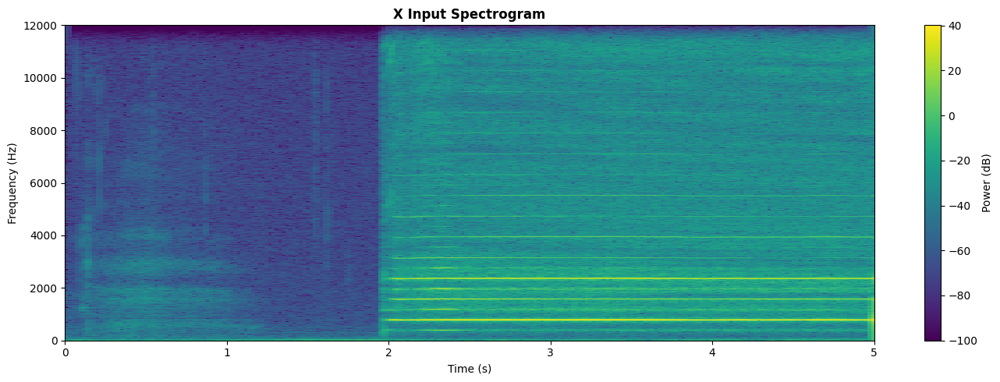

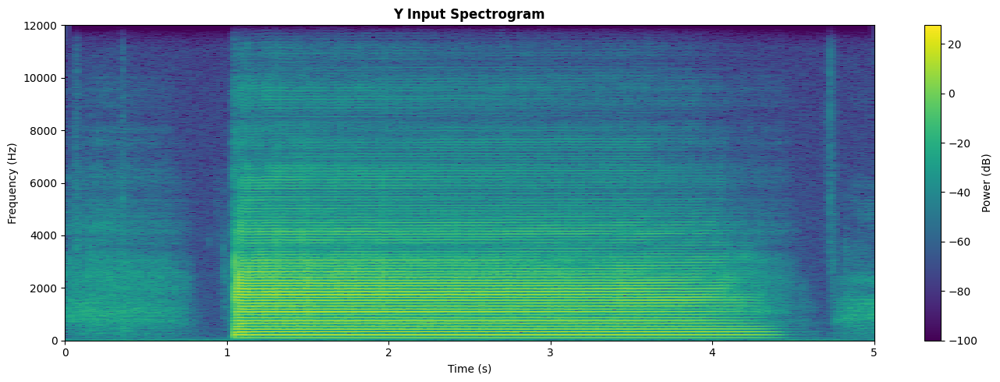

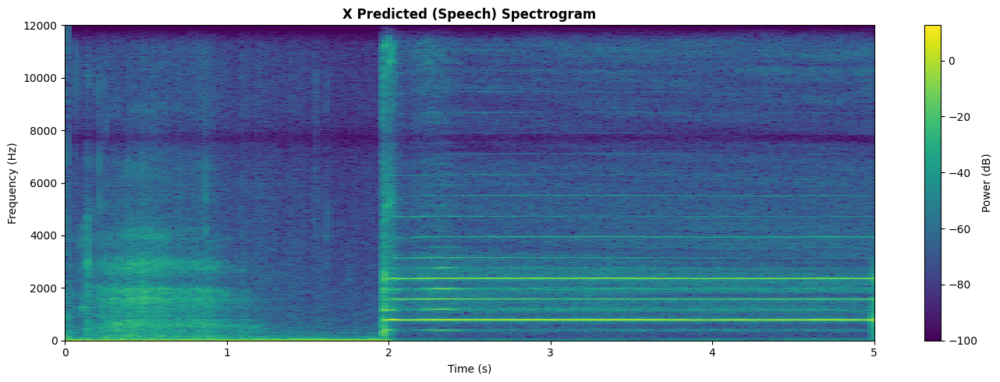


PARAMETER COMPARISONS

Speech Model - Parameter Comparison: Actual vs Predicted
Parameter                           Actual                    Predicted                 Error          
----------------------------------------------------------------------------------------------------

PEQ Parameters:
  Low Shelf       Gain  :          15.22 dB                   15.22 dB                  0.00 dB
  Low Shelf       Cutoff:            138 Hz                     138 Hz                     0 Hz
  Low Shelf       Q     :              0.44                       0.44                     0.00

  Band 1          Gain  :           8.93 dB                    8.93 dB                  0.00 dB
  Band 1          Cutoff:            503 Hz                     503 Hz                     0 Hz
  Band 1          Q     :              0.18                       0.18                     0.00

  Band 2          Gain  :          -1.53 dB                   -1.53 dB                  0.00 dB
  Band 2          Cutof

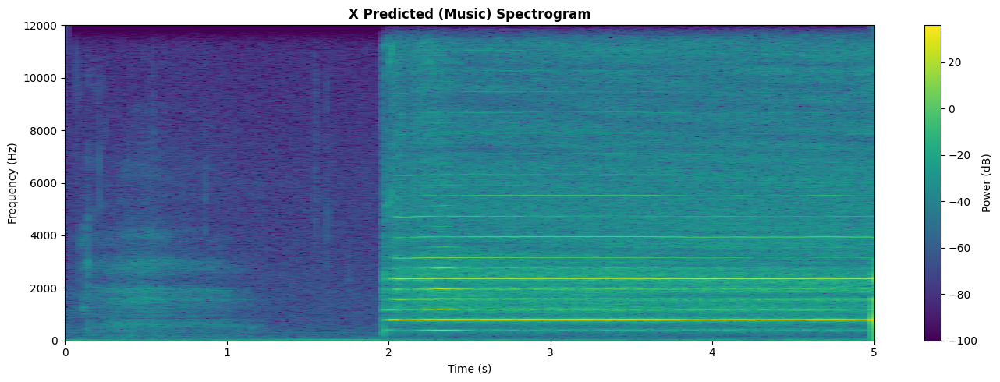


PARAMETER COMPARISONS

Music Model - Parameter Comparison: Actual vs Predicted
Parameter                           Actual                    Predicted                 Error          
----------------------------------------------------------------------------------------------------

PEQ Parameters:
  Low Shelf       Gain  :          -0.04 dB                   -0.04 dB                  0.00 dB
  Low Shelf       Cutoff:            116 Hz                     116 Hz                     0 Hz
  Low Shelf       Q     :              0.40                       0.40                     0.00

  Band 1          Gain  :           4.43 dB                    4.43 dB                  0.00 dB
  Band 1          Cutoff:            610 Hz                     610 Hz                     0 Hz
  Band 1          Q     :              0.18                       0.18                     0.00

  Band 2          Gain  :           2.38 dB                    2.38 dB                  0.00 dB
  Band 2          Cutoff

In [30]:
show_results()

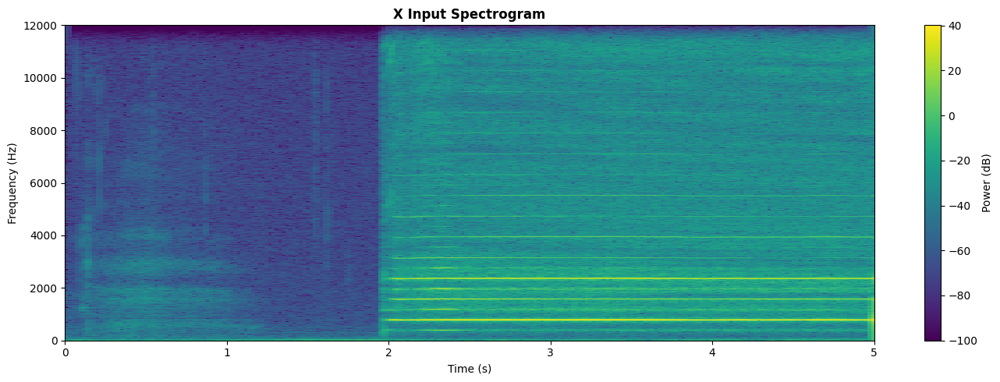

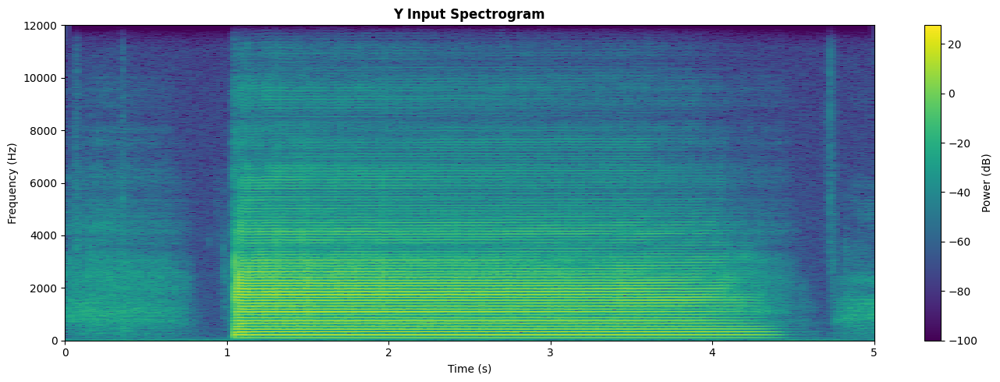

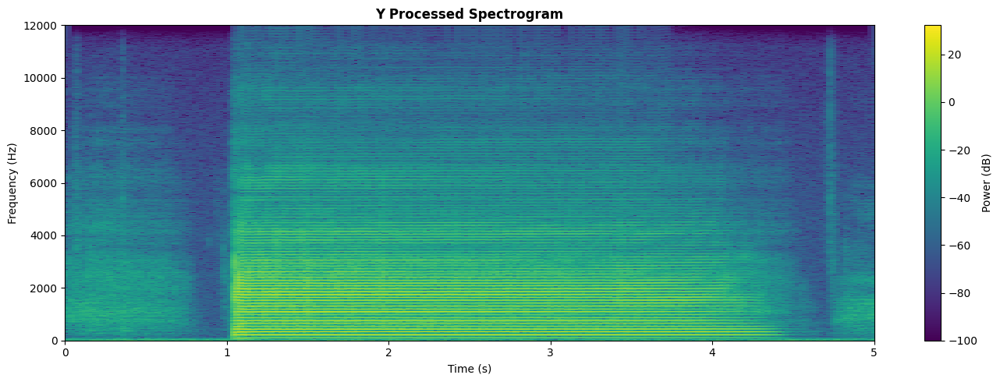

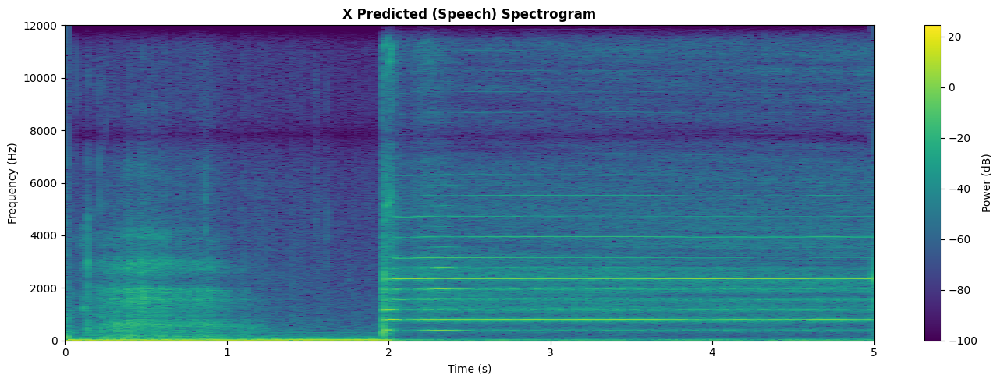


PARAMETER COMPARISONS

Speech Model - Parameter Comparison: Actual vs Predicted
Parameter                           Actual                    Predicted                 Error          
----------------------------------------------------------------------------------------------------

PEQ Parameters:
  Low Shelf       Gain  :           9.60 dB                   22.24 dB                 12.64 dB
  Low Shelf       Cutoff:             92 Hz                     130 Hz                    38 Hz
  Low Shelf       Q     :              5.05                       0.51                     4.54

  Band 1          Gain  :           4.80 dB                    7.77 dB                  2.97 dB
  Band 1          Cutoff:            398 Hz                     524 Hz                   126 Hz
  Band 1          Q     :              5.05                       0.31                     4.74

  Band 2          Gain  :           0.00 dB                   -0.60 dB                  0.60 dB
  Band 2          Cutof

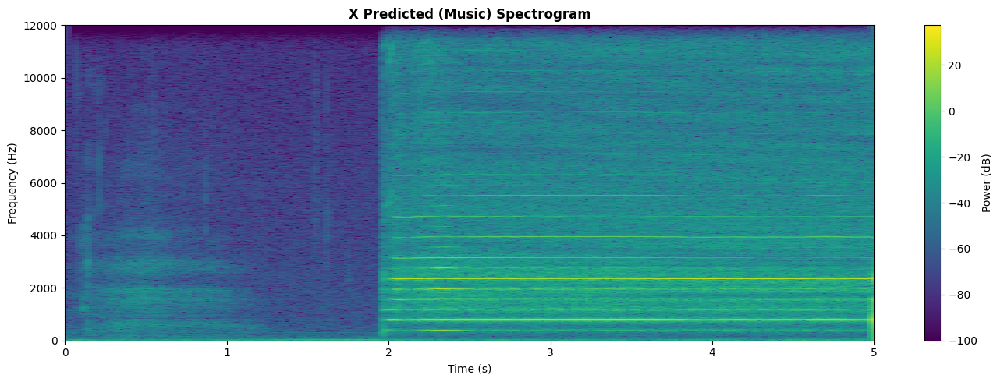


PARAMETER COMPARISONS

Music Model - Parameter Comparison: Actual vs Predicted
Parameter                           Actual                    Predicted                 Error          
----------------------------------------------------------------------------------------------------

PEQ Parameters:
  Low Shelf       Gain  :           9.60 dB                    3.86 dB                  5.74 dB
  Low Shelf       Cutoff:             92 Hz                      84 Hz                     8 Hz
  Low Shelf       Q     :              5.05                       0.44                     4.61

  Band 1          Gain  :           4.80 dB                    3.59 dB                  1.21 dB
  Band 1          Cutoff:            398 Hz                     558 Hz                   160 Hz
  Band 1          Q     :              5.05                       0.15                     4.90

  Band 2          Gain  :           0.00 dB                    1.94 dB                  1.94 dB
  Band 2          Cutoff

In [28]:
show_results(mode="mode2", run_num=1)

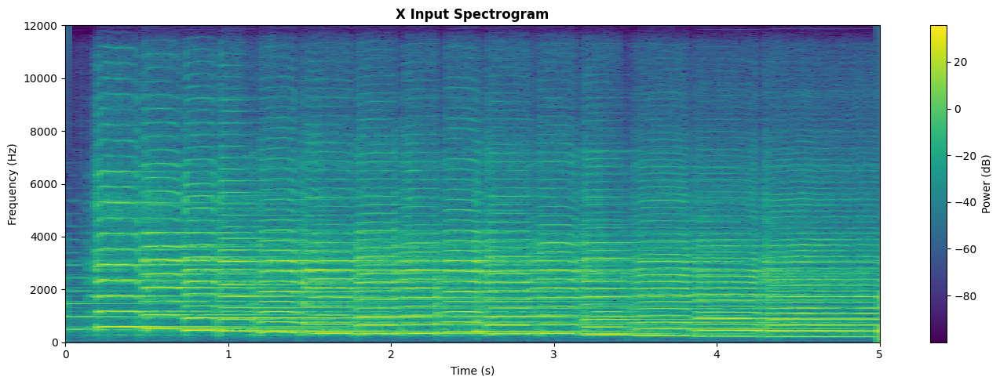

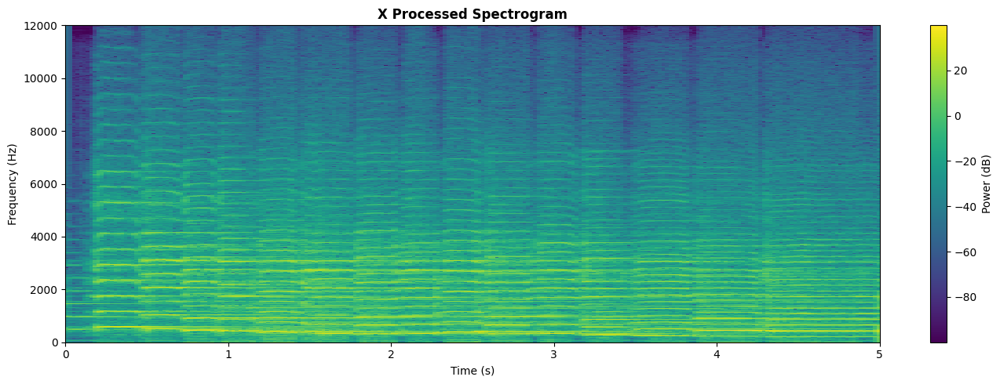

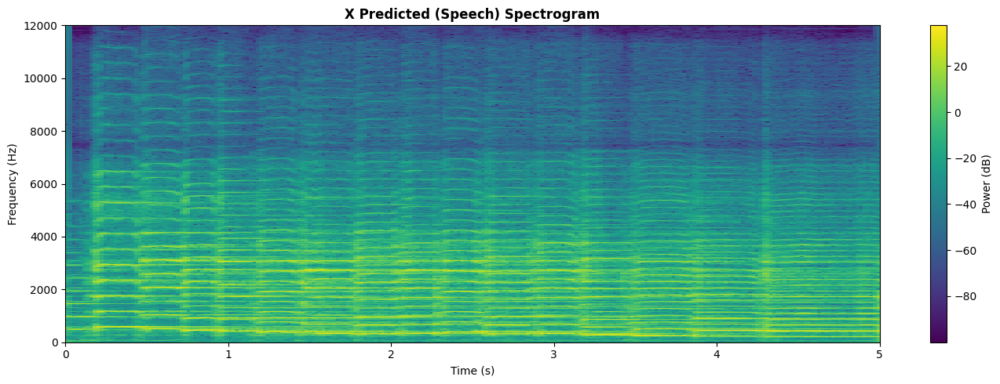


PARAMETER COMPARISONS

Speech Model - Parameter Comparison: Actual vs Predicted
Parameter                           Actual                    Predicted                 Error          
----------------------------------------------------------------------------------------------------

PEQ Parameters:
  Low Shelf       Gain  :           9.60 dB                   23.95 dB                 14.35 dB
  Low Shelf       Cutoff:             92 Hz                     111 Hz                    19 Hz
  Low Shelf       Q     :              5.05                       0.65                     4.40

  Band 1          Gain  :           4.80 dB                   -7.29 dB                 12.09 dB
  Band 1          Cutoff:            398 Hz                     571 Hz                   173 Hz
  Band 1          Q     :              5.05                       0.23                     4.82

  Band 2          Gain  :           0.00 dB                   -2.05 dB                  2.05 dB
  Band 2          Cutof

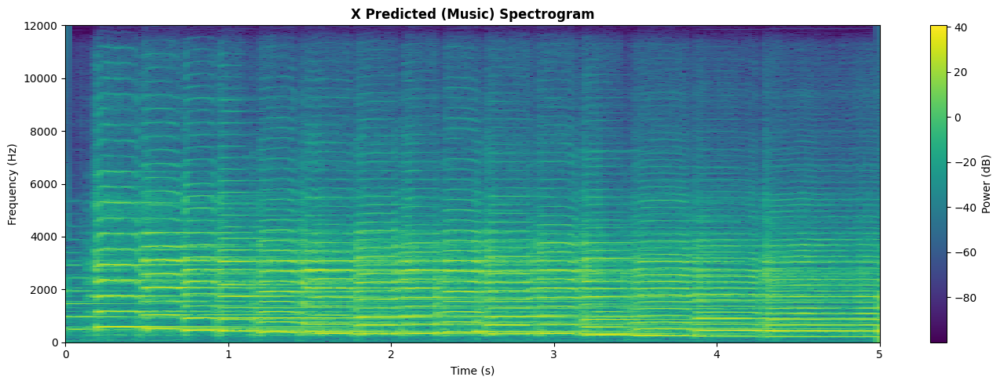


PARAMETER COMPARISONS

Music Model - Parameter Comparison: Actual vs Predicted
Parameter                           Actual                    Predicted                 Error          
----------------------------------------------------------------------------------------------------

PEQ Parameters:
  Low Shelf       Gain  :           9.60 dB                   22.42 dB                 12.82 dB
  Low Shelf       Cutoff:             92 Hz                      69 Hz                    23 Hz
  Low Shelf       Q     :              5.05                       0.41                     4.64

  Band 1          Gain  :           4.80 dB                   -2.55 dB                  7.35 dB
  Band 1          Cutoff:            398 Hz                     624 Hz                   226 Hz
  Band 1          Q     :              5.05                       0.13                     4.92

  Band 2          Gain  :           0.00 dB                    1.42 dB                  1.42 dB
  Band 2          Cutoff

In [26]:
show_results(mode="mode1", run_num=1)
